In [132]:
# Giotto TDA

from gtda.time_series import (
    SingleTakensEmbedding
)

from gtda.mapper import (
    CubicalCover,
    OneDimensionalCover,
    make_mapper_pipeline,
    Projection,
    Eccentricity,
    plot_static_mapper_graph,
    plot_interactive_mapper_graph,
    FirstSimpleGap,
    MapperInteractivePlotter
)

from gtda.plotting import plot_point_cloud
import plotly.graph_objects as go

from sklearn import datasets
from sklearn.cluster import DBSCAN, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap # can calculate the intrinsic distance matrix
from sklearn.preprocessing import FunctionTransformer # define custom transformers (geodesic distances)
from sklearn.neighbors import KernelDensity
from sklearn.ensemble import IsolationForest
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import StandardScaler

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

import math
import random

In [70]:
water_level_data=pd.read_csv('time_series_data/Ilkley_Moor_Water_Level_Monitor.csv')
water_level_data

,OBJECTID,FLOW,WATER_LEVEL,DATE_,SHAPEAREA,SHAPELEN
0,1,403.427734,0.364,2019/10/08 05:30:00+00,750000,3236.067977
1,2,403.427734,0.364,2019/10/08 05:45:00+00,750000,3236.067977
2,3,403.427734,0.364,2019/10/08 06:00:00+00,750000,3236.067977
3,4,403.427734,0.364,2019/10/08 06:15:00+00,750000,3236.067977
4,5,403.427734,0.364,2019/10/08 06:30:00+00,750000,3236.067977
...,...,...,...,...,...,...
91978,113116,0.000309,0.110,2022/03/28 04:30:00+00,750000,3236.067977
91979,113117,0.000343,0.111,2022/03/28 04:45:00+00,750000,3236.067977
91980,113118,0.000343,0.111,2022/03/28 05:00:00+00,750000,3236.067977
91981,113119,0.000343,0.111,2022/03/28 05:15:00+00,750000,3236.067977


(array([6.7627e+04, 7.5610e+03, 3.7790e+03, 1.3070e+03, 7.1100e+02,
        7.1900e+02, 4.2900e+02, 3.6600e+02, 2.6400e+02, 1.4400e+02,
        1.8100e+02, 1.2600e+02, 1.1000e+02, 1.0300e+02, 5.9000e+01,
        1.2600e+02, 6.9000e+01, 1.2600e+02, 6.0000e+01, 9.7000e+01,
        5.8000e+01, 7.2000e+01, 5.9000e+01, 6.8000e+01, 4.3000e+01,
        3.9000e+01, 3.5000e+01, 7.5000e+01, 1.3000e+02, 1.4300e+02,
        1.4100e+02, 1.3300e+02, 8.7000e+01, 0.0000e+00, 1.8900e+02,
        1.7400e+02, 1.2600e+02, 0.0000e+00, 2.5400e+02, 2.4100e+02,
        0.0000e+00, 2.5500e+02, 1.9800e+02, 0.0000e+00, 1.8200e+02,
        1.5000e+02, 0.0000e+00, 1.2600e+02, 0.0000e+00, 1.1000e+02,
        0.0000e+00, 1.1700e+02, 0.0000e+00, 9.8000e+01, 0.0000e+00,
        1.4700e+02, 0.0000e+00, 9.8000e+01, 0.0000e+00, 8.4000e+01,
        0.0000e+00, 9.4000e+01, 0.0000e+00, 1.1100e+02, 0.0000e+00,
        1.1400e+02, 0.0000e+00, 0.0000e+00, 7.6000e+01, 0.0000e+00,
        1.3600e+02, 0.0000e+00, 0.0000e+00, 9.50

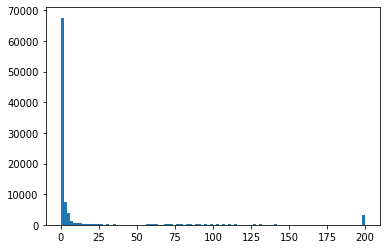

In [136]:
#np.histogram(water_level_data.FLOW)
inds = water_level_data.FLOW >= 200
water_level_data.iloc[inds, 1] = 200

plt.hist(water_level_data.FLOW, bins = 100)

In [137]:
fig = go.Figure(go.Scatter(x=water_level_data.DATE_, y=water_level_data.FLOW))
fig.add_scatter(x=water_level_data.DATE_, y=water_level_data.WATER_LEVEL*5000)

Now, construct a data frame of takens embeddings and add the flow as an extra variable

In [161]:
time_delay_1 = 100
dimension_1 = 240
stride_1 = 120

embedder_1 = SingleTakensEmbedding(
    parameters_type="search",
    n_jobs=2,
    time_delay = time_delay_1,
    dimension = dimension_1,
    stride = stride_1
)

embeddings_1 = embedder_1.fit_transform(water_level_data.WATER_LEVEL)
embeddings_1.shape

(761, 8)

In [162]:
embedder_1

SingleTakensEmbedding(dimension=240, n_jobs=2, stride=120, time_delay=100)

In [163]:
df_1 = pd.DataFrame(embeddings_1)
df_1

,0,1,2,3,4,5,6,7
0,0.363,0.363,0.215,0.215,0.211,0.215,0.210,0.208
1,0.208,0.216,0.214,0.220,0.214,0.209,0.209,0.212
2,0.216,0.213,0.219,0.211,0.209,0.214,0.211,0.209
3,0.212,0.217,0.211,0.208,0.215,0.211,0.209,0.208
4,0.216,0.211,0.208,0.214,0.211,0.208,0.207,0.206
...,...,...,...,...,...,...,...,...
756,0.124,0.167,0.138,0.125,0.128,0.124,0.121,0.118
757,0.162,0.134,0.125,0.128,0.124,0.121,0.119,0.115
758,0.132,0.124,0.127,0.123,0.119,0.116,0.115,0.114
759,0.130,0.125,0.122,0.118,0.116,0.116,0.114,0.112


In [164]:
# Get the indexes of the last embedding value
indexes = np.arange(0,water_level_data.shape[0])
indexes_embeddings_1 = embedder_1.transform(indexes)

# these are the indices of the last value in the embedding:
# indexes_embeddings_1[:,-1]

# this is the flow value of the last vlaue in every embedding vector:
water_level_data.FLOW.iloc[indexes_embeddings_1[:,-1]]

782      0.556482
902      0.696323
1022     0.588797
1142     0.556482
1262     0.496669
           ...   
91502    0.000705
91622    0.000521
91742    0.000470
91862    0.000381
91982    0.000423
Name: FLOW, Length: 761, dtype: float64

In [165]:
df_1["FLOW"] = water_level_data.FLOW.iloc[indexes_embeddings_1[:,-1]].values
df_1



,0,1,2,3,4,5,6,7,FLOW
0,0.363,0.363,0.215,0.215,0.211,0.215,0.210,0.208,0.556482
1,0.208,0.216,0.214,0.220,0.214,0.209,0.209,0.212,0.696323
2,0.216,0.213,0.219,0.211,0.209,0.214,0.211,0.209,0.588797
3,0.212,0.217,0.211,0.208,0.215,0.211,0.209,0.208,0.556482
4,0.216,0.211,0.208,0.214,0.211,0.208,0.207,0.206,0.496669
...,...,...,...,...,...,...,...,...,...
756,0.124,0.167,0.138,0.125,0.128,0.124,0.121,0.118,0.000705
757,0.162,0.134,0.125,0.128,0.124,0.121,0.119,0.115,0.000521
758,0.132,0.124,0.127,0.123,0.119,0.116,0.115,0.114,0.000470
759,0.130,0.125,0.122,0.118,0.116,0.116,0.114,0.112,0.000381


# Mapper

In [166]:
# L infinity centrality
def calc_centrality_filter(df):
    distance_matrix = pairwise_distances(df, metric = "correlation")
    maxdistances = np.zeros(df.shape[0])
    
    for i in np.arange(df.shape[0]):
        maxdistances[i] = np.amax(distance_matrix[i,:])
        
    return maxdistances

centrality_filter = FunctionTransformer(calc_centrality_filter)

In [167]:
# Intrinsic Distance / Geodesic Distance
# Isomap wird nur genutzt, um diese metrik zu berechnen

def calc_instrinsic_distance(df):
    embedding = Isomap(n_neighbors = 5)
    data_isomap = embedding.fit(df)
    dist_matrix = embedding.dist_matrix_
    return dist_matrix

intrinsic_distance = FunctionTransformer(calc_instrinsic_distance)

In [169]:
### FILTER FUNCTIONS ###

#filter_func = Isomap(n_components = 2)
filter_func = PCA(n_components = 2)
#filter_func = lambda x: np.linalg.norm(x, ord = 2)
#filter_func = Eccentricity()
#filter_func = anomaly_score
#filter_func = centrality_filter
#filter_func = Projection(columns=[0])



### COVERS ###

cover = CubicalCover(kind = 'uniform', # balanced: every bin has the same number of observations
                    n_intervals = 10,
                    overlap_frac = 0.2) 



### CLUSTERING ###

#clusterer = FirstSimpleGap(linkage = "single")
clusterer = DBSCAN(eps = 0.5, min_samples = 3)

#clusterer = AgglomerativeClustering(linkage = 'single', 
#                                    n_clusters = None, 
#                                    distance_threshold = 0.5,
#                                    affinity = 'precomputed')


n_jobs = 1 # Configure parallelism of clustering step

# Initialize pipeline
pipe = make_mapper_pipeline(
    filter_func=filter_func,
    cover=cover,
    clusterer=clusterer,
    verbose=False,
    n_jobs=n_jobs,
    contract_nodes = False
    #clustering_preprocessing = intrinsic_distance
)

plotter = MapperInteractivePlotter(pipe, df_1.iloc[:,np.arange(0,8)])
plotter.plot()

In [170]:
plot_interactive_mapper_graph(pipe, df_1.iloc[:,np.arange(0,8)], color_data = df_1["FLOW"] )

0

In [108]:
np.sum(df_1.iloc[:,np.arange(0,24)] >= 1000)

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
18    0
19    0
20    0
21    0
22    0
23    0
dtype: int64